In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os, sys
import itertools
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import patches as mpl_patches
from matplotlib.colors import Colormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
# Additional modules
# TODO: understand modules below
from tensorflow.contrib.data import shuffle_and_repeat
from tensorflow.contrib.data import parallel_interleave
from tensorflow.contrib.data import batch_and_drop_remainder

In [3]:
sys.path.insert(1, os.path.join(sys.path[0], ".."))
from reproduction import analysis

In [4]:
import scipy.stats as scs

In [10]:
import tensorflow as tf

In [97]:
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering

In [252]:
from scipy.stats import wasserstein_distance

In [270]:
import seaborn

## Function for load data

In [11]:
def load_tfdata(serialized_data,
                shape,
                batch_size=1,
                read_threads=4,
                shuffle_buffer_size=1000,
                prefetch=1,
                distribute=(1, 0)
               ):
    
    def parser(serialized_data):
        features = {
            "shape": tf.FixedLenFeature([3], tf.int64),
            "patch": tf.FixedLenFeature([], tf.string),
            "filename":tf.FixedLenFeature([],tf.string),
            "coordinate":tf.FixedLenFeature([2],tf.int64),
        }
        decoded = tf.parse_single_example(serialized_data,features)
        patch   = tf.reshape(tf.decode_raw(decoded["patch"], tf.float32), decoded["shape"])
        
        # randomly crop mini-patches from data
        patch = tf.random_crop(patch, shape)
        
        return decoded["filename"], decoded["coordinate"], patch
 
    # TODO: understand this code
    dataset = (
    tf.data.Dataset.list_files(serialized_data, shuffle=True)
    .shard(*distribute)
    .apply(
        parallel_interleave(
                lambda f: tf.data.TFRecordDataset(f).map(parser),
                cycle_length=read_threads,
                sloppy=True,
            )
        )
    )

    # TODO: understand the code
    dataset = dataset.apply(batch_and_drop_remainder(batch_size)).prefetch(prefetch)
    return dataset

In [16]:
def _get_num_imgs(tfrecord):
    count=0
    for irecord in tf.python_io.tf_record_iterator(tfrecord):
        count += 1
    return count

In [12]:
def _get_cloud_data(filelist, encoder):
    imgs_list = []
    for ifile in filelist:
        load_data = (load_tfdata(ifile, encoder.input_shape[1:]))
        imgs = analysis._get_imgs(load_data, n=_get_num_imgs(ifile))
        print(" ## Image shape ",imgs.shape, " ##" )
        imgs_list += [imgs]
    return np.asarray(imgs_list)

In [27]:
def img_concatenation(imgs,skip=15):
    """ Gen Square like array image
        Because of np.asarray, some reduandant arrays are left out
    """
    col = []
    n = len(imgs)
    icount = 0
    for idx, i in enumerate(range(0,n, skip)):
        if n - (i+skip) > 0:
            col.append(np.concatenate([x for x in imgs[i:i+skip]], axis=1))
            icount += 1
    #if n - icount*skip > 0:
    #    print(n-icount*skip)
    #    j = n-icount*skip
    #    col.append(np.concatenate([x for x in imgs[j:]], axis=1))
    for idx, i in enumerate(col):
        print(i[idx].shape)
    return np.concatenate(col, axis=0)

In [42]:
def _plottings(img_array, img, ilabel='X'):
    fig = plt.figure(figsize=(20,16))
    # 2D Map
    ax = plt.subplot(211)
    im = plt.imshow(img_array[:,:,0])
    divider = make_axes_locatable(ax)
    ax_cb = divider.new_horizontal(size="2%", pad=0.05)
    fig.add_axes(ax_cb)
    fig.colorbar(im, cax=ax_cb)
    ax.set_title("Concatenated %s Cells" %ilabel ,fontsize=20)
    ax.tick_params(labelsize=18)

    # Histgram including left out arrays for plotting
    fig = plt.figure(figsize=(12,8))
    ax = plt.subplot(212)
    hist_array = img[:,:,:, 0].flatten()   # get hist array 
    # set weights for correct output
    weights = np.ones(len(hist_array))/float(len(hist_array))
    ax.hist(hist_array, density=True, weights=weights)       
    ax.set_title("Distribution of %s Cells" %ilabel, fontsize=20)
    ax.tick_params(labelsize=18)

    fig.tight_layout()
    plt.show()

# Check labeling 

# Load data and model (m22)

In [21]:
datadir = '/home/tkurihana/scratch-midway2/clouds'
#
# bopens = as un-brigjt as open; bcloseds = as bright as closed
#
bopens   = datadir+'/2017JAN12MOD09GA_open/open_analogue.tfrecord'
bcloseds = datadir+'/2017JAN12MOD09GA_close/closed_analogue.tfrecord'

In [14]:
model_dir = "/home/tkurihana/clouds/output/m9-22_oceans/"
ENCODER_DEF=model_dir+'encoder.json'
ENCODER_WEIGHTS=model_dir+'encoder.h5'
with open(ENCODER_DEF,"r") as f:
    encoder = tf.keras.models.model_from_json(f.read())
encoder.load_weights(ENCODER_WEIGHTS)

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/tensorflow/python/keras/layers/core.py:791: UserWarning: models is not loaded, but a Lambda layer uses it. It may cause errors.
  , UserWarning)


Image data

In [22]:
oimgs = _get_cloud_data(filelist=[bopens], encoder=encoder)

 ## Image shape  (99, 128, 128, 7)  ##


In [23]:
cimgs = _get_cloud_data(filelist=[bcloseds], encoder=encoder)

 ## Image shape  (92, 128, 128, 7)  ##


Concatenated to one image data

In [28]:
oimg = np.concatenate(oimgs, axis=0)
cimg = np.concatenate(cimgs, axis=0)

In [29]:
oimg_array = img_concatenation(oimg, skip=int(np.sqrt(len(oimg))))

(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)


In [30]:
cimg_array = img_concatenation(cimg, skip=int(np.sqrt(len(cimg))))

(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)


## plot check

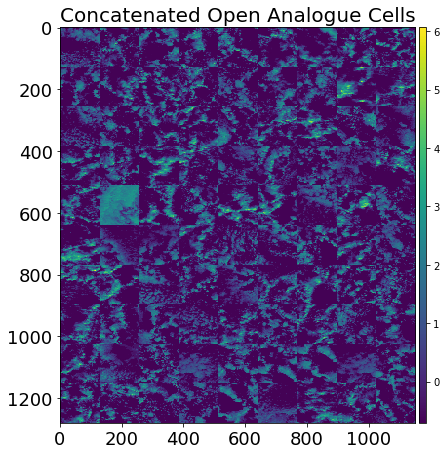

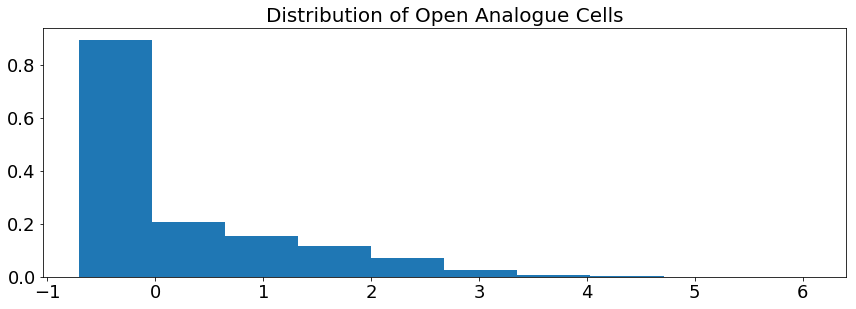

In [43]:
_plottings(img_array=oimg_array, img=oimg, ilabel='Open Analogue')

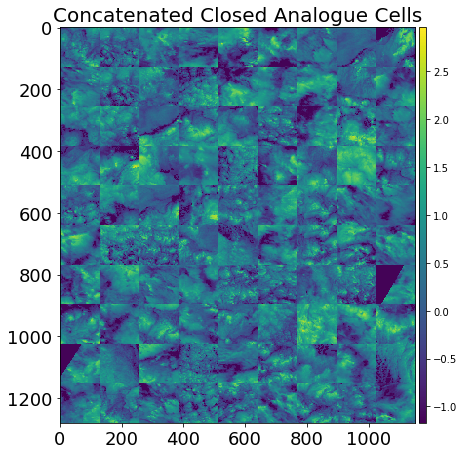

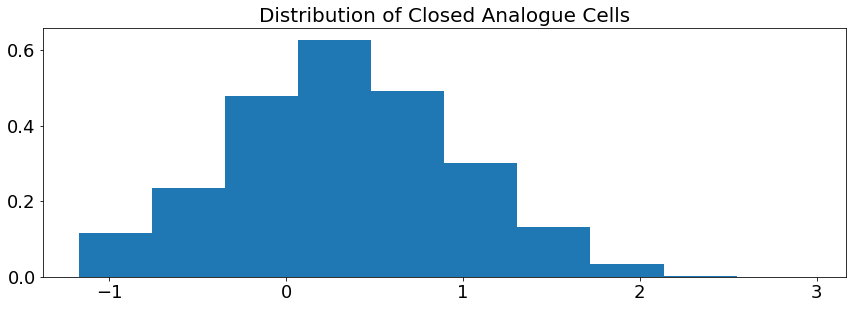

In [44]:
_plottings(img_array=cimg_array, img=cimg, ilabel='Closed Analogue')

## Load Open/Closed data for comapring distribution

In [45]:
open_img   = np.load(datadir+"/open_array.npy")
closed_img = np.load(datadir+"/closed_array.npy")

In [46]:
open_img.shape

(235, 128, 128, 7)

In [47]:
open_img_array = img_concatenation(open_img, skip=int(np.sqrt(len(open_img))))

(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)
(1920, 7)


In [48]:
closed_img_array = img_concatenation(closed_img, skip=int(np.sqrt(len(closed_img))))

(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)
(2048, 7)


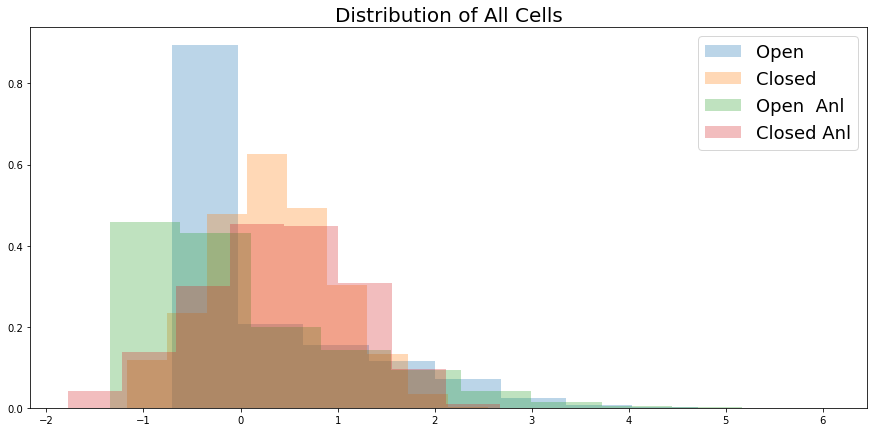

In [55]:
plt.figure(figsize=(15,7))
for i , ilabel, in zip ([oimg,cimg, open_img, closed_img],
                        ["Open", "Closed", "Open  Anl", "Closed Anl"]
                        ):
    hist_array = i[:,:,:,0].flatten()
    weights = np.ones(len(hist_array))/float(len(hist_array))
    plt.hist(hist_array, weights=weights, density=True, alpha=0.3, label=ilabel)
plt.title("Distribution of All Cells", fontsize=20)
plt.legend(fontsize=18)
plt.show()

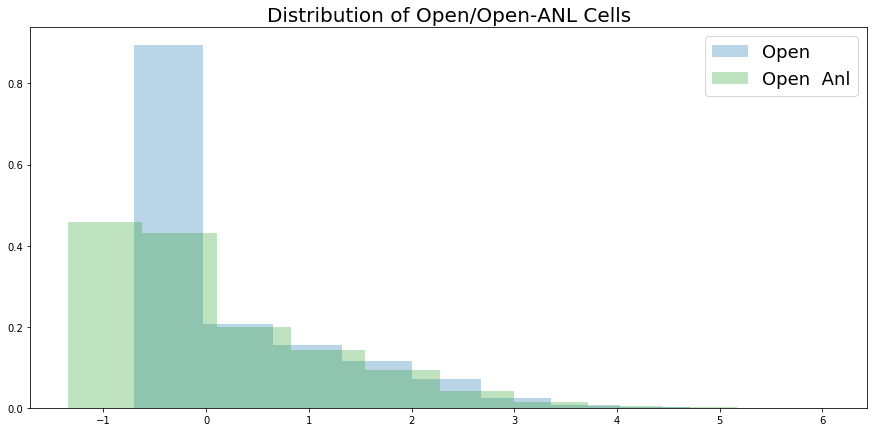

In [56]:
plt.figure(figsize=(15,7))
for i , ilabel,icolor in zip ([oimg, open_img ],
                        ["Open",  "Open  Anl", ],
                        ["#1f77b4", "#2ca02c"]
                        ):
    hist_array = i[:,:,:,0].flatten()
    weights = np.ones(len(hist_array))/float(len(hist_array))
    plt.hist(hist_array, weights=weights, density=True, alpha=0.3, label=ilabel, color=icolor)
plt.title("Distribution of Open/Open-ANL Cells", fontsize=20)
plt.legend(fontsize=18)
plt.show()

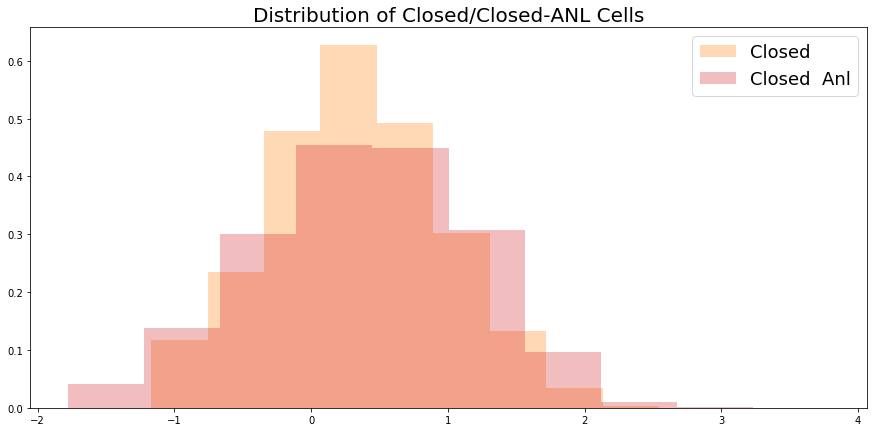

In [59]:
plt.figure(figsize=(15,7))
for i , ilabel,icolor in zip ([cimg, closed_img ],
                        ["Closed",  "Closed  Anl", ],
                        ["#ff7f0e", "#d62728"]
                        ):
    hist_array = i[:,:,:,0].flatten()
    weights = np.ones(len(hist_array))/float(len(hist_array))
    plt.hist(hist_array, weights=weights, density=True, alpha=0.3, label=ilabel, color=icolor)
plt.title("Distribution of Closed/Closed-ANL Cells", fontsize=20)
plt.legend(fontsize=18)
plt.show()

## Stats Value

In [61]:
def _cloud_stats(img):
    img_vals = []
    for i in img:
        tmp = i[:,:,0].flatten()
        img_vals += [len(np.argwhere( tmp > 0))/len(tmp)]
    mean = np.mean(img_vals)*100
    stdv = np.std(img_vals)
    skew = scs.skew(img_vals)
    kurt = scs.kurtosis(img_vals)
    for jdx, j in enumerate([mean, stdv, skew, kurt]):
        print(" %d moment  == %f " %(jdx+1, j))

In [62]:
#OPEN ANL
_cloud_stats(oimg)

 1 moment  == 38.761270 
 2 moment  == 0.066837 
 3 moment  == 7.055905 
 4 moment  == 60.806382 


In [63]:
#Closed ANL
_cloud_stats(cimg)

 1 moment  == 69.848036 
 2 moment  == 0.066938 
 3 moment  == 1.753397 
 4 moment  == 6.776805 


# Analysis

get 90 patches from each label, and then 

1. try spectral clustering for these data

2. make one image to check agglomerative clustering on entire image

## Choose 90 images randomly from open and closed array

In [68]:
 np.random.randint(closed_img.shape[0], size=2, dtype=np.int64)

array([249, 208])

In [69]:
a = closed_img[np.random.randint(closed_img.shape[0], size=2, dtype=np.int64)]

In [70]:
a.shape

(2, 128, 128, 7)

In [ ]:
s_opens

In [71]:
cimg.shape

(92, 128, 128, 7)

In [91]:
s_open = np.append(oimg[:37], oimg[38:91], axis=0 ) 

In [92]:
s_open.shape

(90, 128, 128, 7)

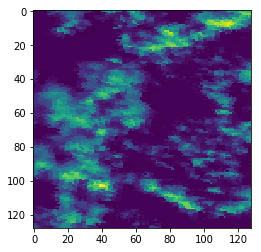

In [82]:
plt.imshow(s_open[36, :,:, 0])

get rid of index 37 which was mis-classified druing labeling process

In [84]:
s_closed = cimg[:90]

In [85]:
_opens = open_img[np.random.randint(open_img.shape[0], size=90, dtype=np.int64)]

In [89]:
_closeds = closed_img[np.random.randint(closed_img.shape[0], size=90, dtype=np.int64)]

In [93]:
print(_opens.shape, _closeds.shape, s_open.shape, s_closed.shape)

(90, 128, 128, 7) (90, 128, 128, 7) (90, 128, 128, 7) (90, 128, 128, 7)


## Clustering by Spectral 

In [254]:
# encoder imgs
opens_encs   = encoder.predict(_opens).mean(axis=(1, 2))
closeds_encs = encoder.predict(_closeds).mean(axis=(1, 2))
bopens_encs  = encoder.predict(s_open).mean(axis=(1, 2))
bcloseds_encs= encoder.predict(s_closed).mean(axis=(1, 2))

In [102]:
oc = np.append(opens_encs, closeds_encs, axis=0)
boc = np.append(bopens_encs, bcloseds_encs, axis=0)

In [103]:
both = np.append(oc, boc, axis=0)

In [104]:
# Number of Clusters
num_clusters = 10
# Number of patches from each label set
N = 90

In [105]:
method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
clusters = method.fit_predict(both)
o, c, bo, bc = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]

N = 10

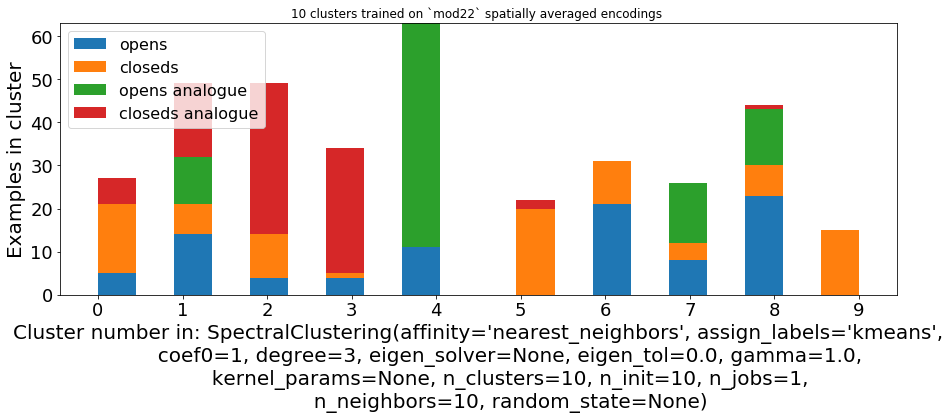

In [109]:
plt.figure(figsize=(15, 5))
plt.hist([o,c,bo, bc], bins=num_clusters*2, 
         label=["opens", "closeds", "opens analogue", "closeds analogue"],
         stacked=True
        )
plt.xlabel("Cluster number in: "+str(method), fontsize=20)
plt.xticks(range(num_clusters))
plt.ylabel("Examples in cluster", fontsize=20)
plt.title("%d clusters trained on `mod22` spatially averaged encodings "%(num_clusters))
plt.legend(fontsize=16, loc='upper left')
plt.tick_params(labelsize=18)

In [125]:
def _mod_cluster(both, ncol=3,  N=30):
    if max(crange) < 21:
        fig = plt.figure(figsize=(40,30))
    else:
        fig = plt.figure(figsize=(30,20))
    row = int(len(crange)/ncol)+1
    for idx, iclus in enumerate(crange):
        num_clusters = iclus 
        method = SpectralClustering(n_clusters=num_clusters, affinity="nearest_neighbors")
        clusters = method.fit_predict(both)
        o, c, bo, bc = clusters[:N], clusters[N:N*2], clusters[N*2:N*3], clusters[N*3:]
        # Fig
        ax = plt.subplot(row,ncol,idx+1)
        plt.hist([o,c,bo, bc], bins=num_clusters*2, 
                 label=["opens", "closeds", "opens analogue", "closeds analogue"],
                 stacked=True
                )
        ax.set_xticks(range(num_clusters))
        ax.set_title("%d clusters" %iclus, fontsize=40)
        ax.tick_params(labelsize=40)
    fig.tight_layout()
    plt.show()

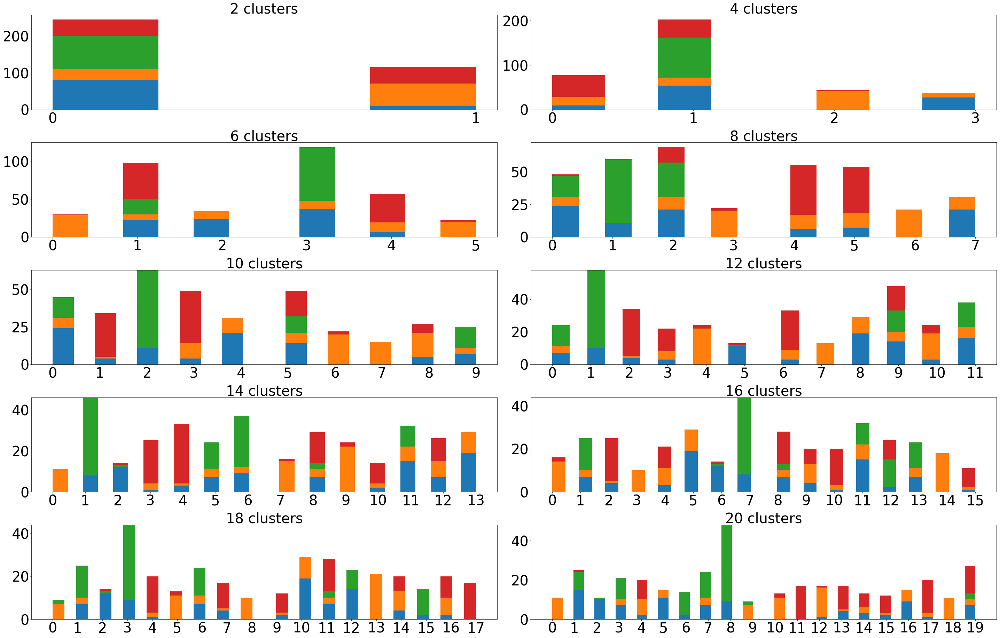

In [126]:
crange = np.arange(2,21,2)
_mod_cluster(both, N=90, ncol=2)

## Clustering by Agglomerative

In [136]:
_opens.shape

(90, 128, 128, 7)

In [139]:
_opens_array = img_concatenation(_opens, skip=int(np.sqrt(len(_opens))))

(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)


In [140]:
_opens_array.shape

(1152, 1152, 7)

In [141]:
_closeds_array = img_concatenation(_closeds, skip=int(np.sqrt(len(_closeds))))

(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)


In [144]:
s_open_array = img_concatenation(s_open, skip=int(np.sqrt(len(s_open))))

(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)


In [142]:
s_closed_array = img_concatenation(s_closed, skip=int(np.sqrt(len(s_closed))))

(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)
(1152, 7)


In [145]:
img1 = np.concatenate((_opens_array, _closeds_array), axis=1)
img2 = np.concatenate((s_open_array, s_closed_array), axis=1)
img = np.concatenate((img1, img2), axis=0)

In [146]:
print(img.shape)

(2304, 2304, 7)


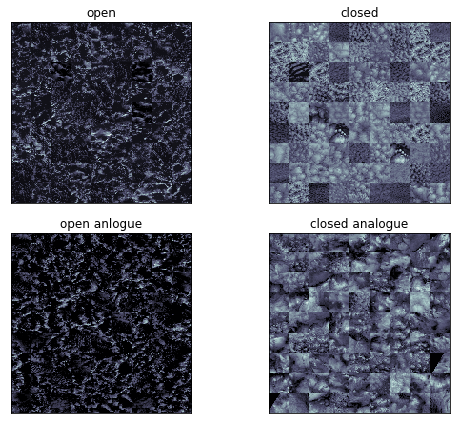

In [150]:
# check images
fig = plt.figure(figsize=(8,6))
for (idx, i), ititle in zip(enumerate([_opens_array, _closeds_array, s_open_array, s_closed_array]
                       ), ['open', 'closed', 'open anlogue', 'closed analogue'] ):
    ax = plt.subplot(2,2,idx+1)
    plt.imshow(i[:,:,0], cmap='bone')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_title("%s" %ititle)
fig.tight_layout()
plt.show()

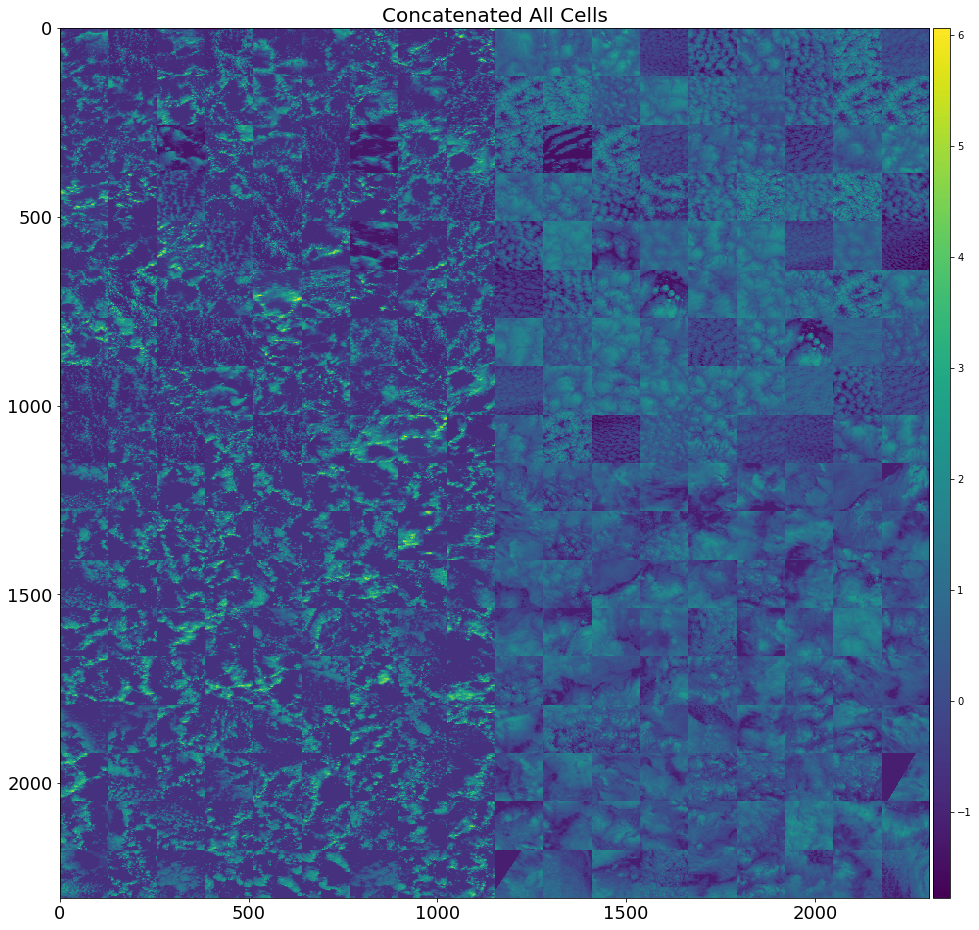

In [147]:
ilabel = "All"
fig = plt.figure(figsize=(20,16))
# 2D Map
ax = plt.subplot(111)
im = plt.imshow(img[:,:,0])
divider = make_axes_locatable(ax)
ax_cb = divider.new_horizontal(size="2%", pad=0.05)
fig.add_axes(ax_cb)
fig.colorbar(im, cax=ax_cb)
ax.set_title("Concatenated %s Cells" %ilabel ,fontsize=20)
ax.tick_params(labelsize=18)

In [153]:
SHAPE = 128, 128, 7

In [154]:
# Color scheme by Ricardo
colors = ["#833f2c",
"#016dec",
"#5cb925",
"#e125a2",
"#2f8900",
"#ff95f9",
"#009650",
"#bb0075",
"#8bd890",
"#d30063",
"#00c7b1",
"#e63e2c",
"#029ebe",
"#f0ae00",
"#b98fff",
"#e1c54c",
"#6e3c92",
"#7ad8b4",
"#ff5655",
"#375c16",
"#ff5677",
"#75481c",
"#ffa2d2",
"#9b280d",
"#ffa47a",
"#952f23",
"#ff804b"]

In [155]:
# generate swath again
swath = img   
swath_mean = swath.mean(axis=(0,1))
swath_std = swath.std(axis=(0,1))
patches = []

stride = 128
patch_size = 128

patches = []
for i in range(0, swath.shape[0], stride):
    row = []
    for j in range(0, swath.shape[1], stride):
        if i + patch_size <= swath.shape[0] and j + patch_size <= swath.shape[1]:
            p = swath[i:i + patch_size, j:j + patch_size].astype(float)
            p -= swath_mean
            p /= swath_std
            
            row.append(p)
    if row:
        patches.append(row)
            
patches = np.stack(patches)

In [151]:
def _anl_agl(encoder, patches, clusters=0):
    # clustering
    _encs = encoder.predict(patches.reshape((-1, 128, 128, 7)))
    method = AgglomerativeClustering(n_clusters=clusters)
    features = _encs.mean(axis=(1,2))
    patches_labels = method.fit_predict(features).reshape(patches.shape[:2])
    return patches_labels

In [163]:
def cluster_plotting(swath, patches,patches_labels, SHAPE, colors, ncluster=0):
    line_width = 4
    fig, a = plt.subplots(figsize=(20,20))
    plt.imshow(swath[:,:,0], cmap="bone")
    rects = []   
    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            a.add_patch(mpl_patches.Rectangle(
                (j * SHAPE[0] + line_width , i * SHAPE[1] + line_width ),
                width=SHAPE[0] - line_width * 2,
                height=SHAPE[1] - line_width * 2,
                linewidth=6,
                edgecolor=colors[patches_labels[i,j]],
                facecolor="none"
            ))
            centerx = 64*(2*j+1) #+1
            centery = 64*(2*i+1) #+1
            # add label as text
            plt.text(centerx, centery, str(patches_labels[i,j]), 
                 fontsize=20,weight='bold', 
                 color=colors[patches_labels[i,j]])
    plt.title(" ## %d cluster ## " %ncluster, fontsize=20)
    plt.show()

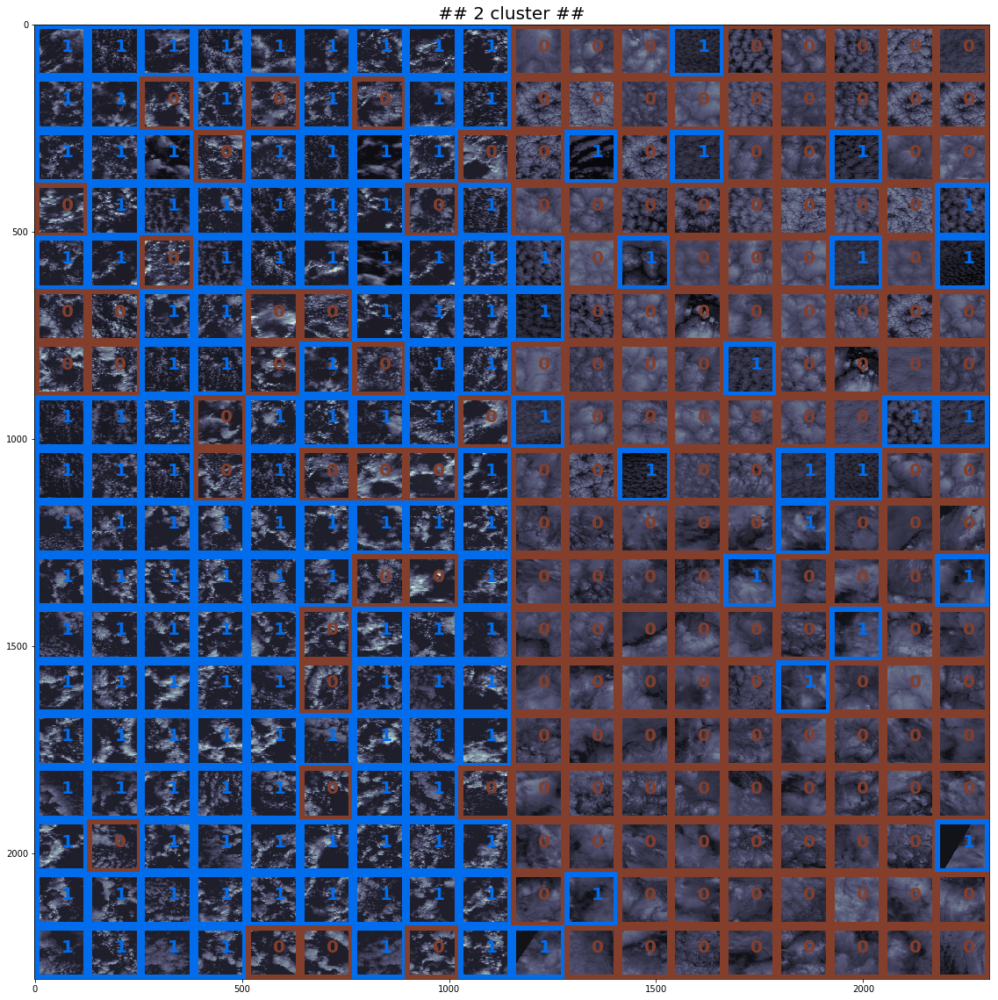

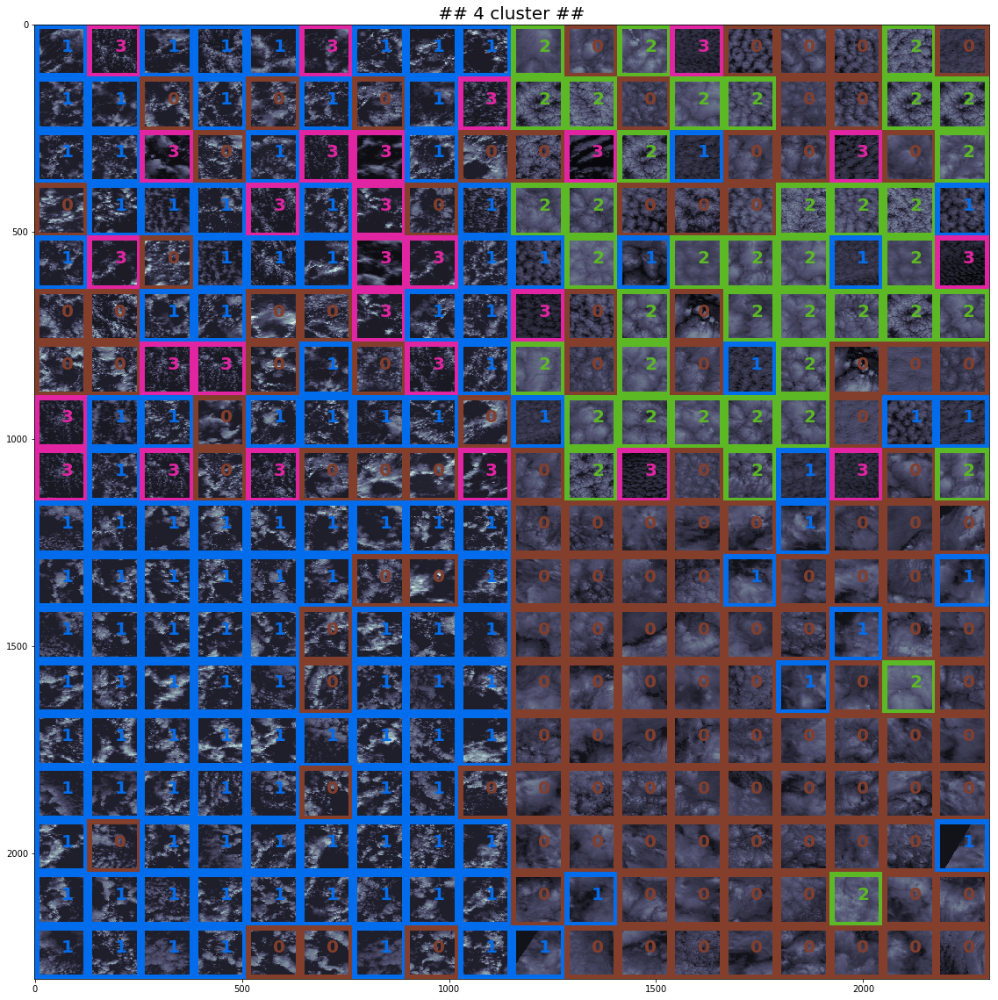

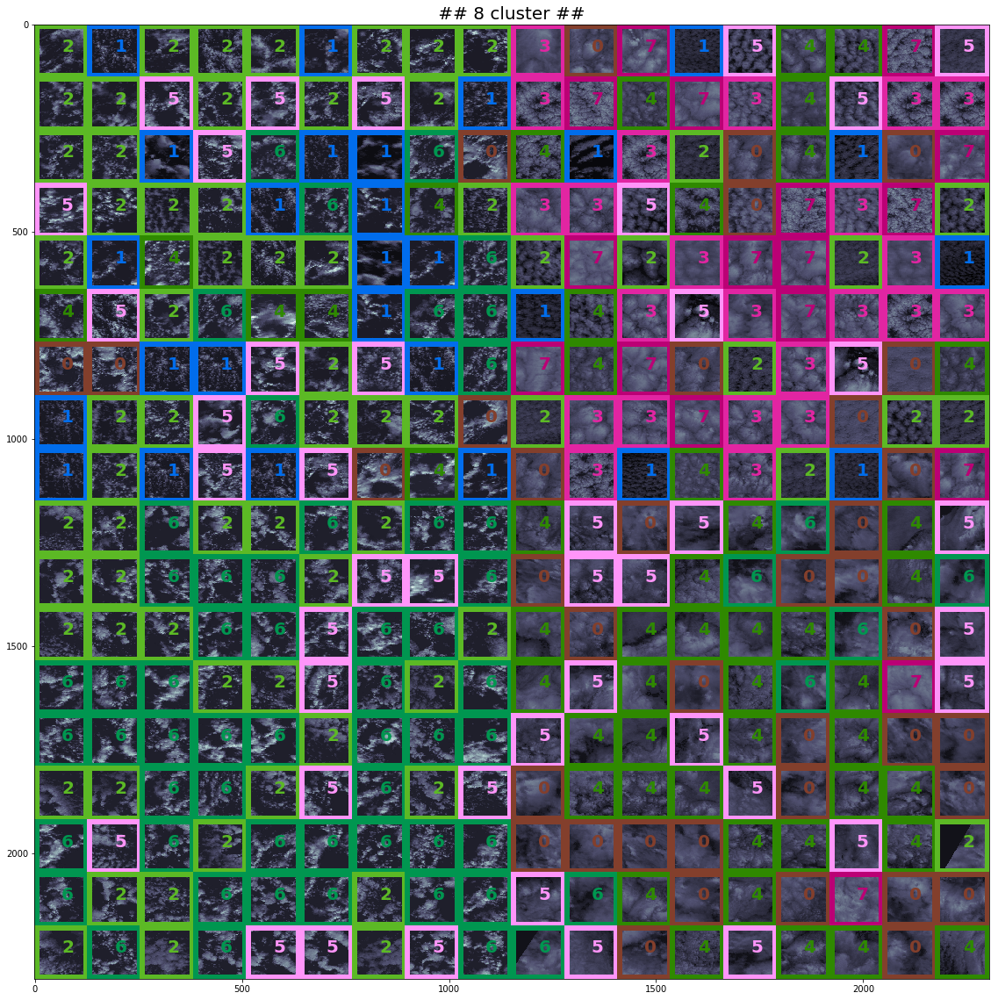

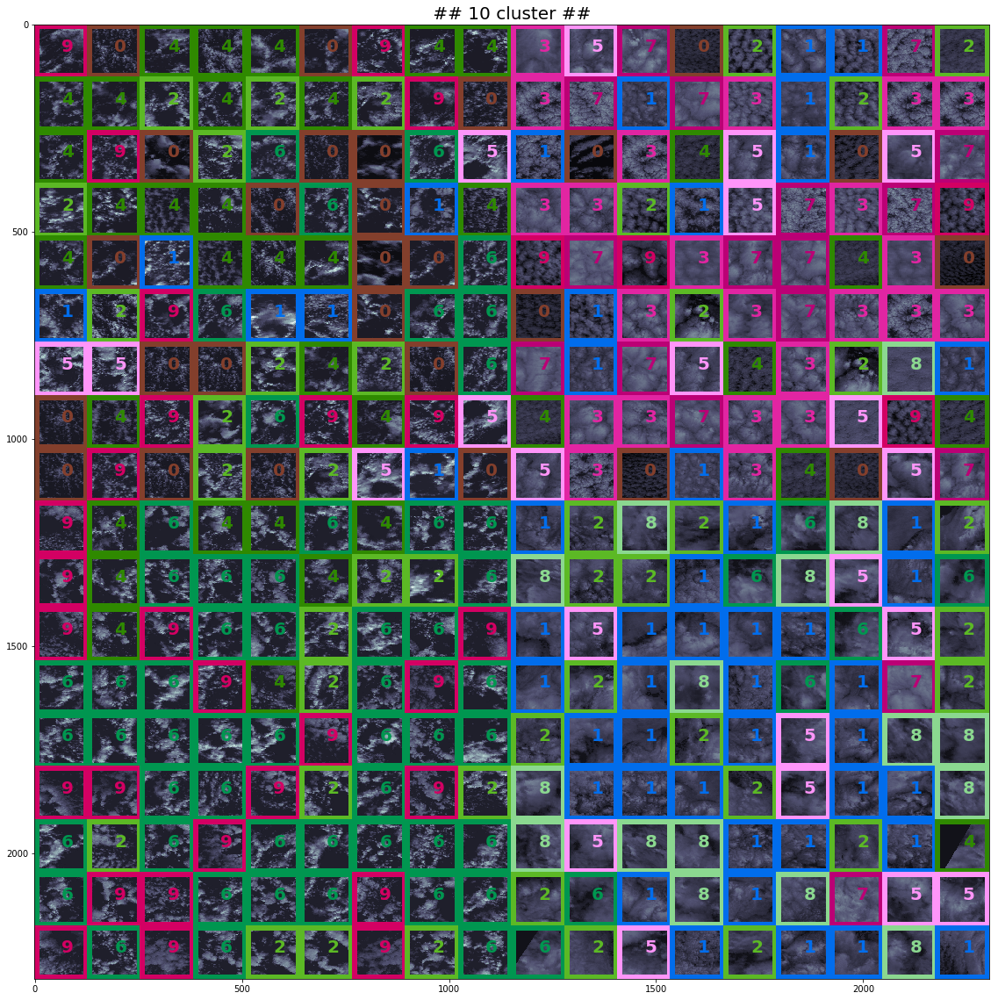

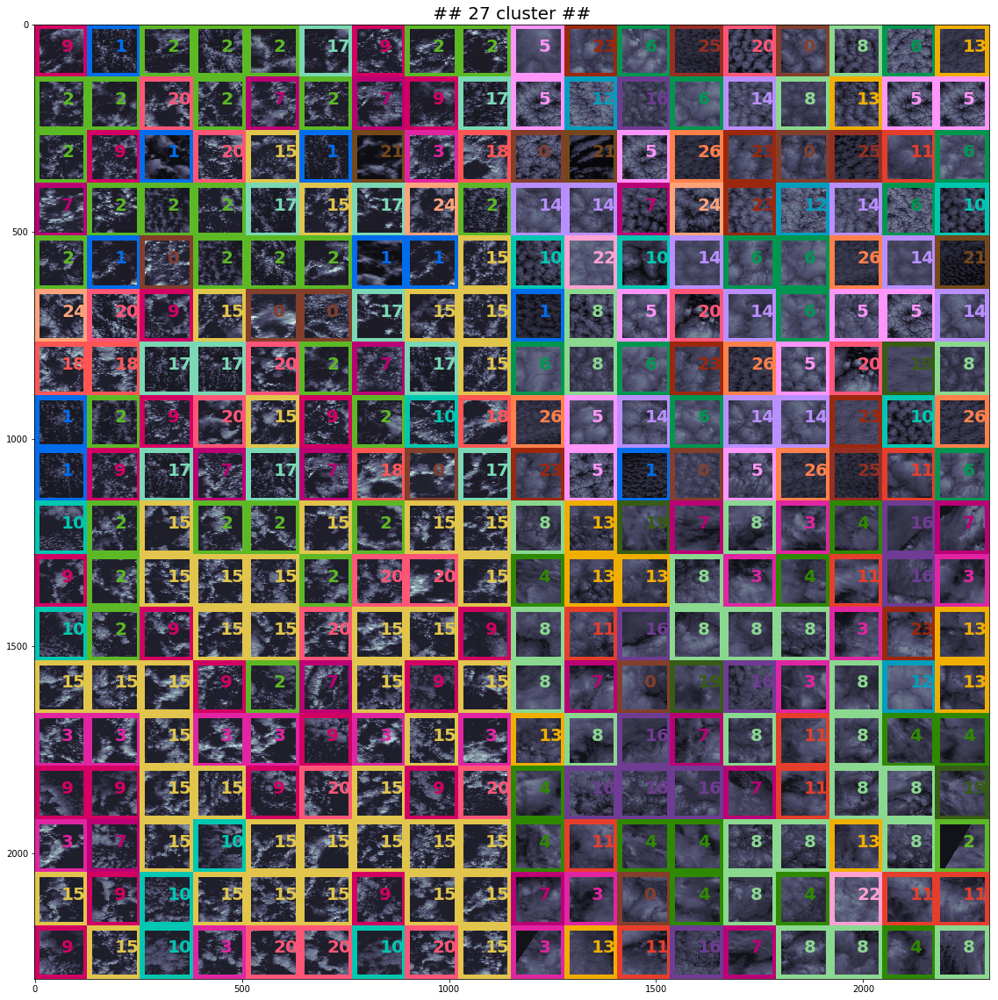

In [164]:
for icluster in [2,4,8,10,27]:
    _patches_labels = _anl_agl(encoder, patches, clusters=icluster)
    cluster_plotting(swath, patches,_patches_labels, SHAPE, colors, ncluster=icluster)

In [166]:
img.shape

(2304, 2304, 7)

In [167]:
# save data
savedir = '/home/tkurihana/scratch-midway2/clouds'
np.save(savedir+'/all_labels_90imgs', img)

In [177]:
def dev_cluster_plotting(swath, patches,patches_labels, SHAPE, colors, ncluster=0):
    line_width = 4
    fig, a = plt.subplots(figsize=(20,20))
    im = plt.imshow(swath[:,:,0], cmap="rainbow")
    fig.colorbar(im, ax=a)
    #rects = []   
    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            a.add_patch(mpl_patches.Rectangle(
                (j * SHAPE[0] + line_width , i * SHAPE[1] + line_width ),
                width=SHAPE[0] - line_width * 2,
                height=SHAPE[1] - line_width * 2,
                linewidth=6,
                edgecolor=colors[patches_labels[i,j]],
                facecolor="none"
            ))
            centerx = 64*(2*j+1) #+1
            centery = 64*(2*i+1) #+1
            # add label as text
            plt.text(centerx, centery, str(patches_labels[i,j]), 
                 fontsize=20,weight='bold', 
                 color=colors[patches_labels[i,j]])
    plt.title(" ## %d cluster ## " %ncluster, fontsize=20)
    plt.show()

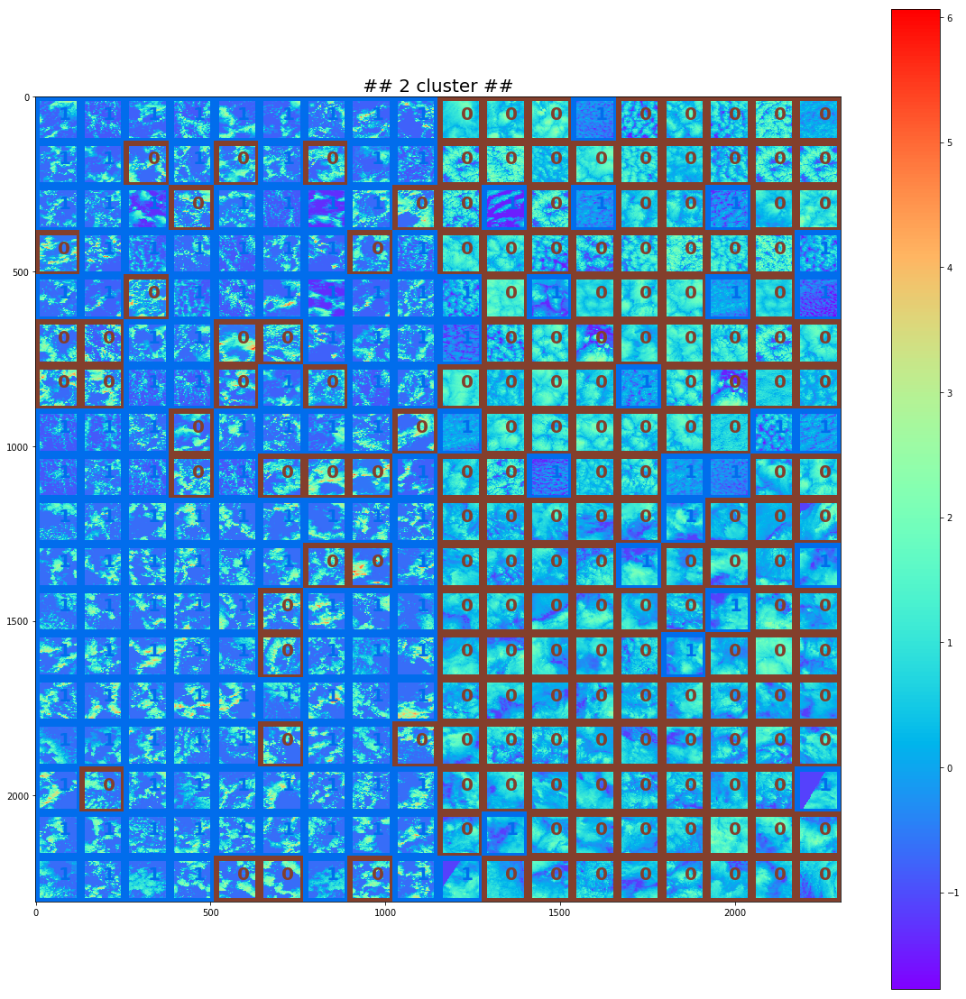

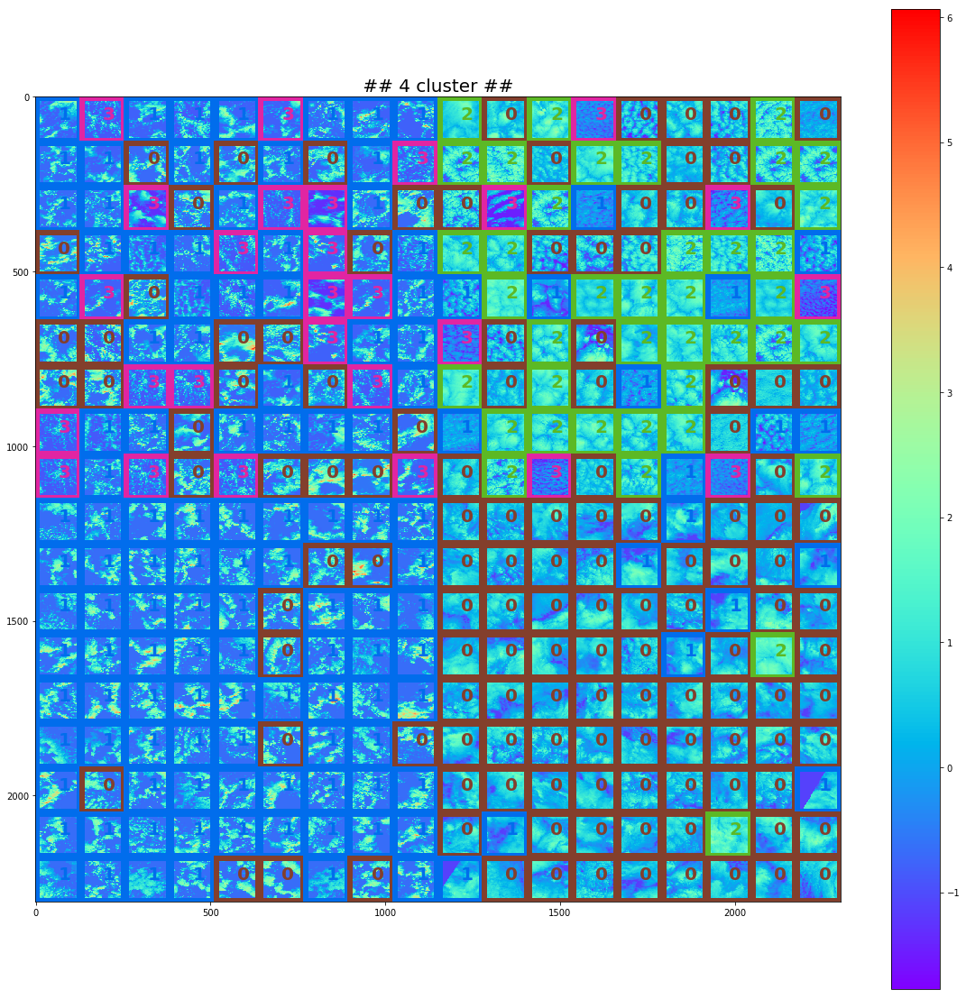

In [178]:
for icluster in [2,4]:
    _patches_labels = _anl_agl(encoder, patches, clusters=icluster)
    dev_cluster_plotting(swath, patches,_patches_labels, SHAPE, colors, ncluster=icluster)

## analysis for radiance strength

In [180]:
patches.shape

(18, 18, 128, 128, 7)

In [187]:
patches_mean = patches.mean(axis=(2,3) )

In [188]:
patches_mean.shape

(18, 18, 7)

In [191]:
patches_mean[0,9,0]

0.6425409387249228

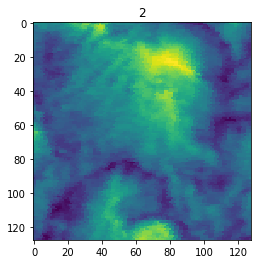

In [194]:
plt.imshow(patches[0,9,:,:,0])
pltting_patches_labels = _anl_agl(encoder, patches, clusters=icluster)
plt.title(str(pltting_patches_labels[0,9]))
plt.show()

make dictionary for cluster number and mean radiance

*Mean*

In [207]:
def _listed_cluster_rad(encoder, patches, icluster=2):
    """ _list [cluster number][mean radiance value]"""
    _list = []
    _patches_labels = _anl_agl(encoder, patches, clusters=icluster)
    _patches_mean = patches.mean(axis=(2,3) )
    for i , j in itertools.product(range(patches.shape[0]), range(patches.shape[1])):
        _list+= [[_patches_labels[i,j], _patches_mean[i,j,0]]]
    return _list   

In [229]:
radiances = _listed_cluster_rad(encoder, patches, icluster=4)

In [209]:
len(radiances)

324

In [230]:
sorted_radiances = sorted(radiances, key=lambda x : x[1], reverse=True)

In [231]:
# split list 
zero_list = [x[1] for x in sorted_radiances if x[0] == 0]
one_list  = [y[1] for y in sorted_radiances if y[0] == 1]

In [232]:
# split list 
two_list = [x[1] for x in sorted_radiances if x[0] == 2]
three_list  = [y[1] for y in sorted_radiances if y[0] == 3]

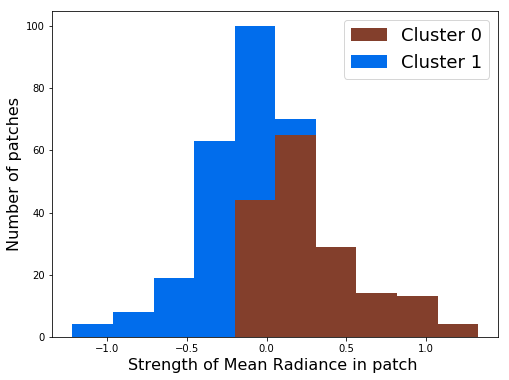

In [228]:
plt.figure(figsize=(8,6))
plt.hist([zero_list , one_list], label=['Cluster 0', 'Cluster 1'], 
         color=[colors[0], colors[1] ], stacked=True)
plt.xlabel("Strength of Mean Radiance in patch ", fontsize=16)
plt.ylabel("Number of patches", fontsize=16)
plt.legend(fontsize=18)
plt.show()

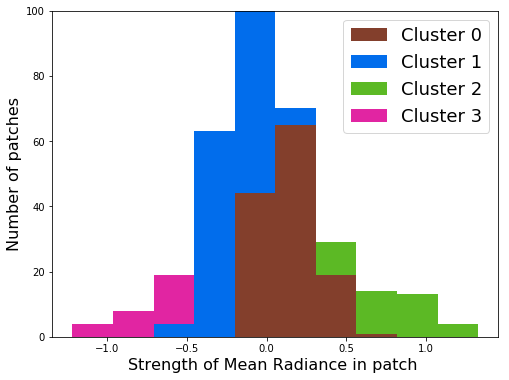

In [235]:
plt.figure(figsize=(8,6))
plt.hist([zero_list , one_list, two_list, three_list], 
         label=['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3'], 
         color=[colors[0], colors[1], colors[2], colors[3] ], stacked=True)
plt.xlabel("Strength of Mean Radiance in patch ", fontsize=16)
plt.ylabel("Number of patches", fontsize=16)
plt.legend(fontsize=18)
plt.show()

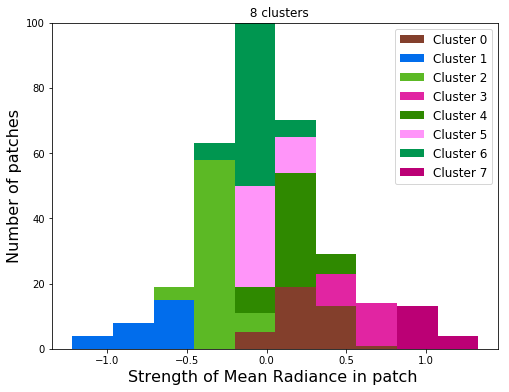

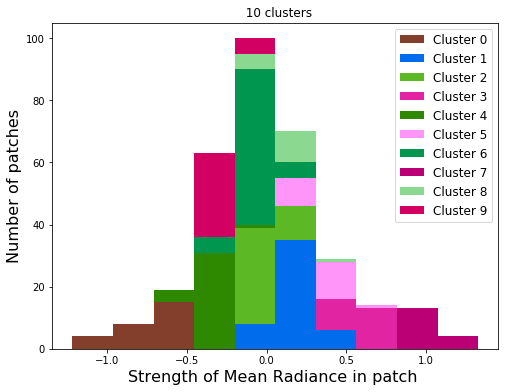

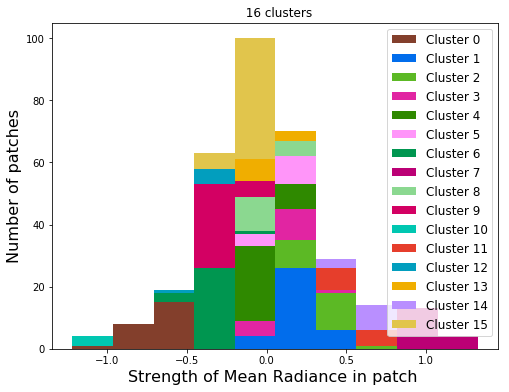

In [244]:
for _cluster in [8,10,16]:
    radiances = _listed_cluster_rad(encoder, patches, icluster=_cluster)
    sorted_radiances = sorted(radiances, key=lambda x : x[1], reverse=True)
    # split list
    clusters_list = []
    labels_list   = []
    for i in range(_cluster):
        clusters_list +=[ [x[1] for x in sorted_radiances if x[0] == i] ]
        labels_list += [ 'Cluster '+str(i)]
    plt.figure(figsize=(8,6))
    plt.hist([ x for x in clusters_list], label=labels_list, 
    color=colors[:_cluster], stacked=True)
    plt.title("  %d clusters" %_cluster)
    plt.xlabel("Strength of Mean Radiance in patch ", fontsize=16)
    plt.ylabel("Number of patches", fontsize=16)
    plt.legend(fontsize=12)
    plt.show()

*standard deviation*

In [245]:
def _listed_cluster_rad(encoder, patches, icluster=2, metric='stdv'):
    """ _list [cluster number][mean radiance value]"""
    _list = []
    _patches_labels = _anl_agl(encoder, patches, clusters=icluster)
    _patches_std = patches.std(axis=(2,3) )
    for i , j in itertools.product(range(patches.shape[0]), range(patches.shape[1])):
        _list+= [[_patches_labels[i,j], _patches_std[i,j,0]]]
    return _list 

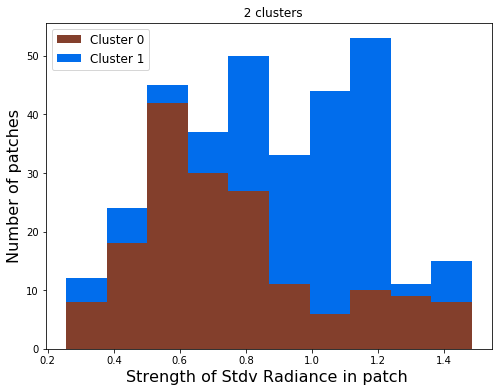

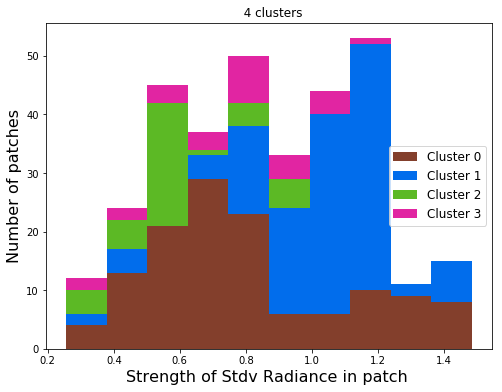

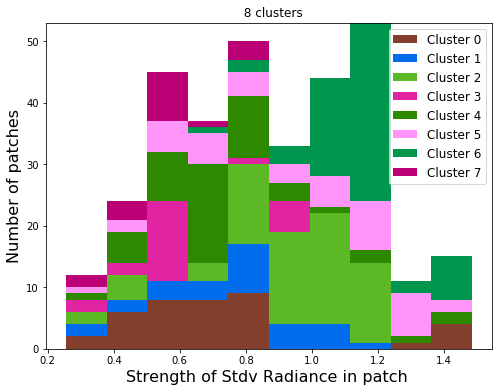

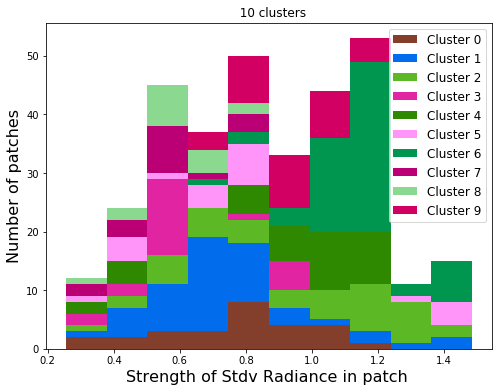

In [246]:
for _cluster in [2, 4, 8,10]:
    radiances = _listed_cluster_rad(encoder, patches, icluster=_cluster)
    sorted_radiances = sorted(radiances, key=lambda x : x[1], reverse=True)
    # split list
    clusters_list = []
    labels_list   = []
    for i in range(_cluster):
        clusters_list +=[ [x[1] for x in sorted_radiances if x[0] == i] ]
        labels_list += [ 'Cluster '+str(i)]
    plt.figure(figsize=(8,6))
    plt.hist([ x for x in clusters_list], label=labels_list, 
    color=colors[:_cluster], stacked=True)
    plt.title("  %d clusters" %_cluster)
    plt.xlabel("Strength of Stdv Radiance in patch ", fontsize=16)
    plt.ylabel("Number of patches", fontsize=16)
    plt.legend(fontsize=12)
    plt.show()

Wasserstain Distance

check how to get **Distribution**

In [247]:
_patches_labels = _anl_agl(encoder, patches, clusters=icluster)
distribution = np.unique(_patches_labels, return_counts=True)

In [249]:
distribution

(array([0, 1, 2, 3]), array([129, 128,  40,  27]))

In [251]:
distribution[1] / distribution[1].sum()

array([0.39814815, 0.39506173, 0.12345679, 0.08333333])

Compute EMD

In [255]:
# encoder imgs
all_opens_encs   = encoder.predict(open_img).mean(axis=(1, 2))
all_closeds_encs = encoder.predict(closed_img).mean(axis=(1, 2))

In [257]:
all_oc = np.append(all_opens_encs, all_closeds_encs, axis=0)

In [258]:
len(all_opens_encs)

235

In [350]:
#method = SpectralClustering(n_clusters=10, affinity="nearest_neighbors")
method = AgglomerativeClustering(n_clusters=40)
clusters = method.fit_predict(all_oc)
o, c= clusters[:len(all_opens_encs)], clusters[len(all_opens_encs):]

In [260]:
print(len(o), len(c))

235 269


In [262]:
def chunking(array, n):
    return [array[x:x+n] for x in range(0, len(array), n)]

In [351]:
olists = chunking(o, n=15)

In [352]:
clists = chunking(c, n=15)

In [266]:
def _get_cluster_distribution(xlists):
    distribution = np.unique(xlists, return_counts=True)[1] # index 1 is counts
    return distribution/distribution.sum()

In [353]:
o_distributions = [ _get_cluster_distribution(ilist) for ilist in olists]

In [354]:
c_distributions = [ _get_cluster_distribution(ilist) for ilist in clists]

Spectral: Number of cluster 10

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


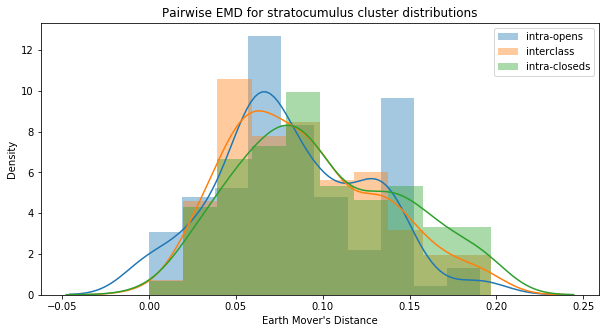

In [271]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


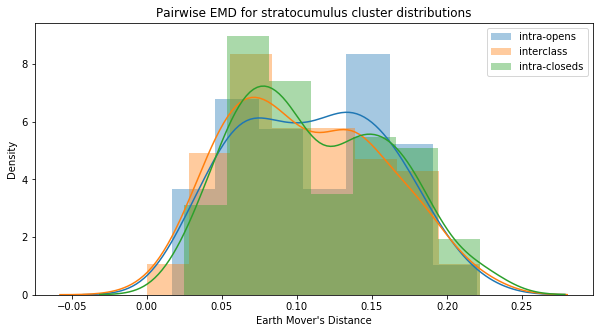

In [286]:
# 20 patches in chunked lists
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


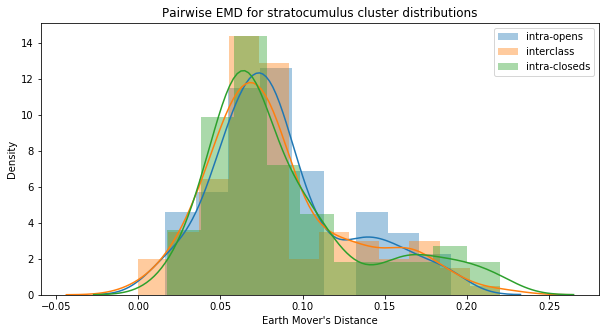

In [291]:
# 25 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


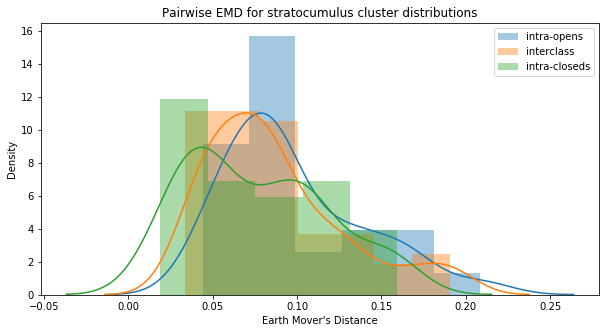

In [296]:
# 30 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

Agglemerative: Number of Cluster 10

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


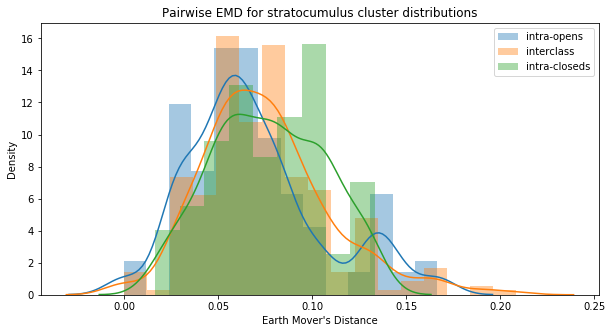

In [302]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


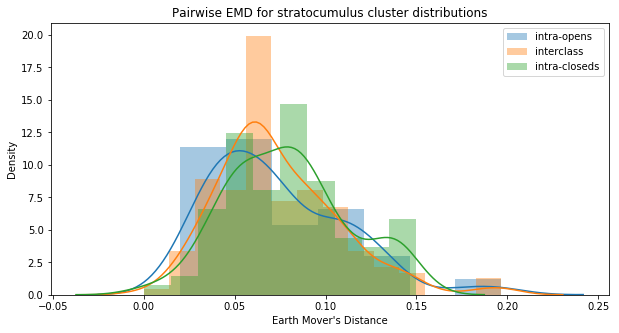

In [307]:
# 20 patches in chunked lists
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


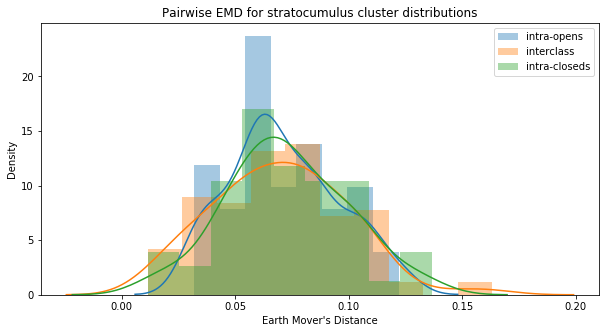

In [312]:
# 25 patches in chunked lists
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

Agglomerative: Number of Cluster 2

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


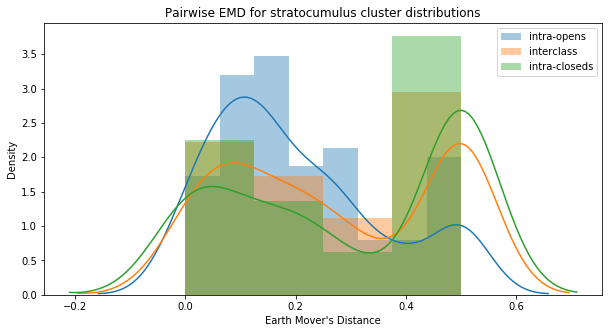

In [318]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

Agglomerative: Numvber of clusters 4 

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


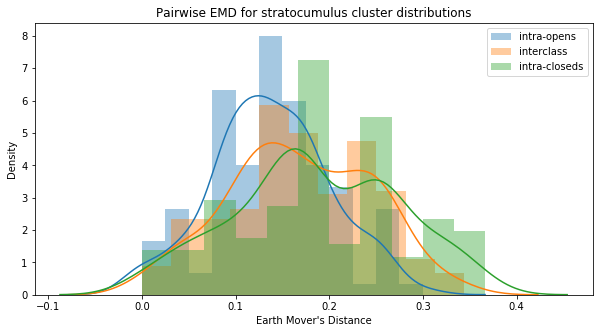

In [324]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

Agglomerative: Number of Clusters 16

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


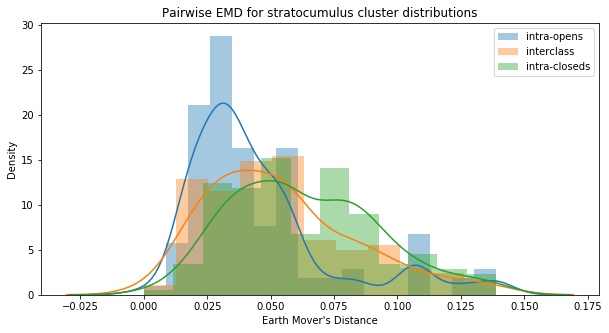

In [330]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

Agglomrative: Number of Clusters 20

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


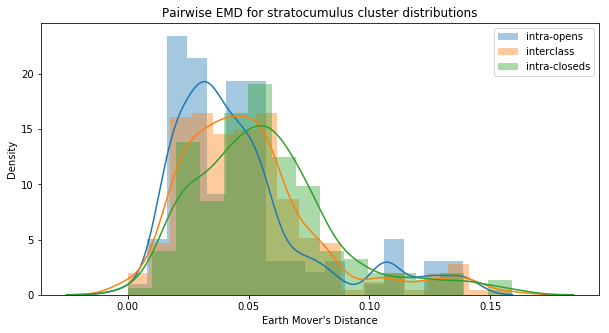

In [336]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

Agglomerative: Number of Clusters 25

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


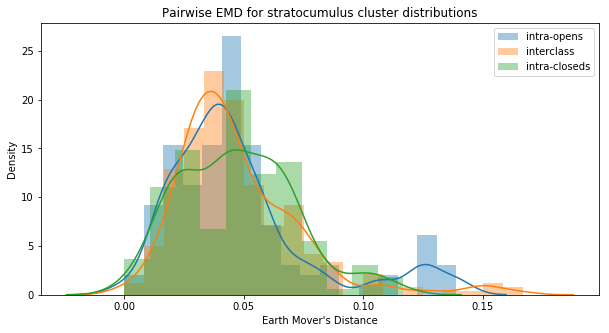

In [342]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

Agglomerative: Number of Clusters 30

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


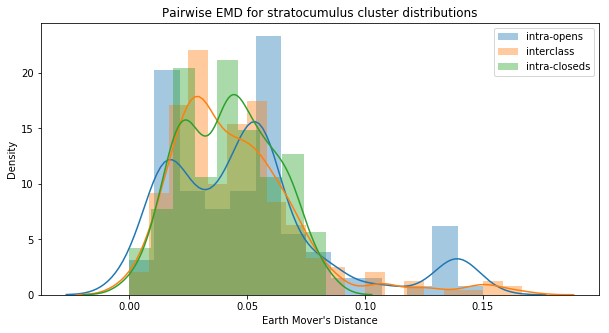

In [349]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()

Agglomerative: Number of Clusters 40

/home/tkurihana/.conda/envs/py3501/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


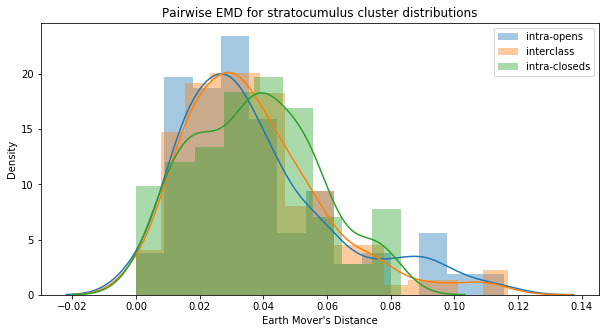

In [355]:
# 15 patches in chunkes list
ds = {}
ds["intra-opens"]   = [wasserstein_distance(x,y) for x in o_distributions for y in o_distributions if x is not y]
ds["interclass"]    = [wasserstein_distance(x,y) for x in o_distributions for y in c_distributions if x is not y]
ds["intra-closeds"] = [wasserstein_distance(x,y) for x in c_distributions for y in c_distributions if x is not y]

plt.figure(figsize=(10, 5))
for i, h in ds.items():
    seaborn.distplot(h, label=i, norm_hist=True)
plt.ylabel("Density")
plt.xlabel("Earth Mover's Distance")
plt.title("Pairwise EMD for stratocumulus cluster distributions")
plt.legend()